In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
# Base libraries
import os
import numpy as np
import pandas as pd
import networkx as nx
import glob

### Helpers

In [3]:
def load_projection(in_file):
    """
    Loads a previously dumped projection graph.
    """
    dump = open(in_file, "r")
    lines = dump.readlines()
    dump.close()

    node_no = int(lines[0].split()[0])
    edge_no = int(lines[0].split()[1])

    nodes = {}
    graph = nx.Graph()
    for lptr in range(1, node_no + 1):
        num_id = int(lines[lptr].split()[0])
        str_id = lines[lptr].split()[1]
        crit = float(lines[lptr].split()[2])
        nodes.update({num_id : str_id})
        graph.add_node(str_id, crit = crit)

    lptr += 1
    for lptr in range(lptr, node_no + 1 + edge_no):
        u = int(lines[lptr].split()[0])
        v = int(lines[lptr].split()[1])
        w = float(lines[lptr].split()[2])
        
        #if w > 0.7:
        graph.add_edge(nodes[u], nodes[v], w = w)
        #else:
            #graph.add_edge(nodes[u], nodes[v], w = 0.)  

    return graph

In [4]:
def load_net_track(in_file):
    """
    Loads a previously dumped net-track graph.
    """
    dump = open(in_file, "r")
    lines = dump.readlines()
    dump.close()

    net_no = int(lines[0].split()[0])
    track_no = int(lines[0].split()[1])
    edge_no = int(lines[0].split()[2])

    nets = {}
    graph = nx.Graph()
    for lptr in range(1, net_no + 1):
        num_id = int(lines[lptr].split()[0])
        str_id = lines[lptr].split()[1]
        crit = float(lines[lptr].split()[2])
        nets.update({num_id : str_id})
        graph.add_node(str_id, crit = crit, bipartite = 0)

    tracks = {}
    for lptr in range(lptr + 1, net_no + 1 + track_no):
        num_id = int(lines[lptr].split()[0])
        str_id = lines[lptr].split()[1]
        tracks.update({num_id : str_id})
        graph.add_node(str_id, bipartite = 1)

    lptr += 1
    for lptr in range(lptr, net_no + 1 + track_no + edge_no):
        u = int(lines[lptr].split()[0])
        v = int(lines[lptr].split()[1])
        w = float(lines[lptr].split()[2])
        #graph.add_edge(nets[u], tracks[v], w = w)
        
        if w > 0.9 and crit > 0.9:
            graph.add_edge(nets[u], tracks[v], w = w, c = 'r', t = 1.)
        else:
            graph.add_edge(nets[u], tracks[v], w = w, c = 'k', t = 0.001)      
        crit = graph.nodes('crit')[nets[u]]

    return graph

In [5]:
def normalize_net_track(G):
    """
    Normalizes the edge weights of the net-track preference graph, on a 
    per-net basis. If this is not done, nets with shorter wirelength 
    (or/and smaller fanout) will be favored (i.e., have heavier incident
    edges).
    """
    for u, attrs in G.nodes(data = True):
        if attrs["bipartite"] == 0:
            max_w = max([G[u][v]['w'] for v in G[u]])
            for v in G[u]:
                G[u][v]['w'] /= max_w 
    return G

In [6]:
def load_graphs(vpr_file_dir, normalize=True):
    """
    Loads the graphs dumped into the VPR file directory.
    """
    net_track_file = vpr_file_dir + "/net_track.dump"
    projection_file = vpr_file_dir + "/projection.dump"
    
    bp = load_net_track(net_track_file)
    if normalize == True:
        bp = normalize_net_track(bp)
    proj = load_projection(projection_file)

    return bp, proj

### Analysis

In [7]:
# load all bipartits and projections
dg = {
    'description': [],
    'bps': [],
    'projs': [],
    'group': []
}

count = 0
gpcnt = 0
for p in glob.iglob('data/*/*'):
    print(p)
    bp, proj = load_graphs(p)
    
    dg['description'].append(os.path.basename(p))
    dg['projs'].append(proj)
    dg['bps'].append(bp)
    
    count += 1
    if count == 6:
        count = 1
        dg['group'].extend([gpcnt]*6)
        gpcnt += 1
    
dfg = pd.DataFrame(dg)
dfg = dfg.sort_values('description')

l = [list(range(6)) for i in range(max(dfg.group) + 1)]
l = [item for sublist in l for item in sublist]

dfg['id'] = l

data/alu2/alu2.36
data/alu2/alu2.46
data/alu2/alu2.42
data/alu2/alu2.34
data/alu2/alu2.40
data/alu2/alu2.30
data/apex6/apex6.34
data/apex6/apex6.48
data/apex6/apex6.42
data/apex6/apex6.46
data/apex6/apex6.38
data/apex6/apex6.52
data/x1/x1.34
data/x1/x1.52
data/x1/x1.42
data/x1/x1.48
data/x1/x1.38
data/x1/x1.46


# Bipartite Graphs
We visualize the graphs as describe in the repors. Briefly, the node set on the right side of the bipartite graph represent the nets and the nodes on the left are the routing tracks used by the net.

* Sizes of nodes on the right: depends on the criticality of the net
* Weigths of edges: likelihood of how good the solution will be if the net is routed through the corresponding track

/home/asiatici/miniconda3/envs/ntds_2019/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


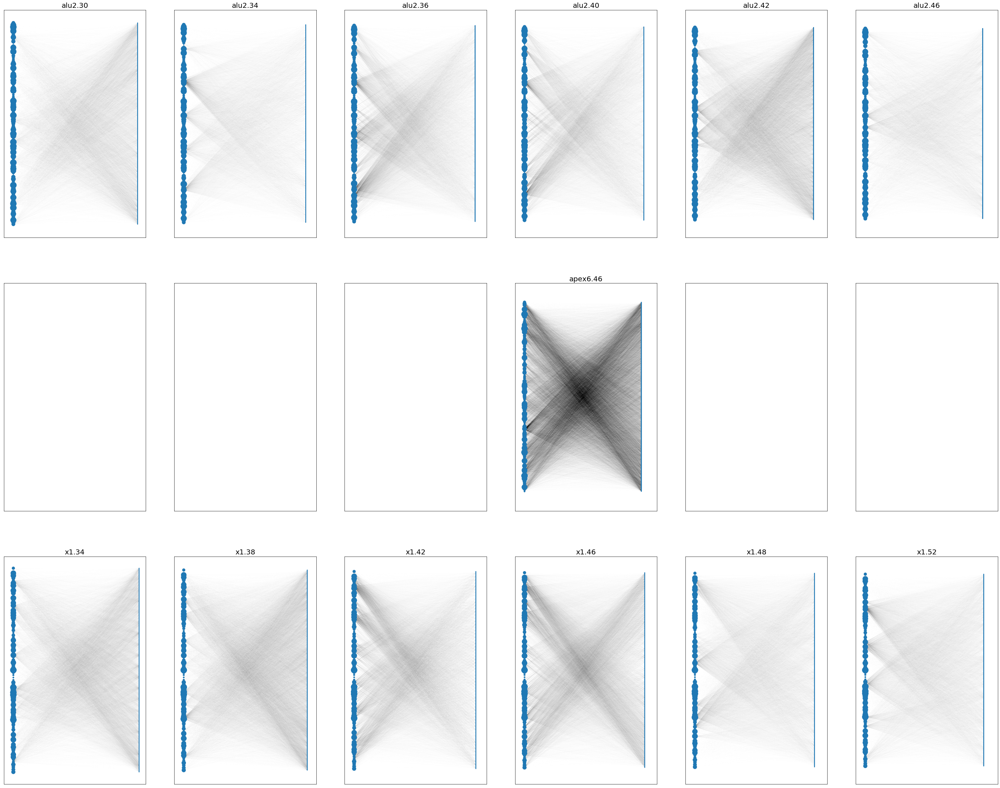

In [8]:
# Classic
fig, axs = plt.subplots(nrows=3, ncols=6, figsize=(50,40), sharey=True, sharex=True)

for i in range(len(dfg)):
    bp = dfg.iloc[i]['bps']
    #print(nx.is_bipartite(bp))

    try:    
        n1, n2 = nx.bipartite.sets(bp)
        # node attributes
        dd = dict(bp.degree)
        dc = nx.get_node_attributes(bp,'crit')
        dn2 = {i: .1 for i in n2}
        dc.update(dn2)

        # edge attributes
        ec = nx.get_edge_attributes(bp,'c')
        ew = nx.get_edge_attributes(bp,'t')

        ids, grp = dfg.iloc[i]['id'], dfg.iloc[i]['group']
        axi = axs[grp][ids]

        nx.draw_networkx(
            bp,
            pos = nx.drawing.layout.bipartite_layout(bp, n1), 
            with_labels=False, arrows=False,
            node_size=[300**v for v in dc.values()], #node_color=[v for v in dc.values()], cmap=plt.cm.Blues, 
            width=0.001, #edges=bp.edges, edge_color=ec.values(),
            ax = axi
        )
        axi.set_title(dfg.iloc[i].description, size=20)
        axi.set_xticks([]); axi.set_yticks([]);
    
    except:
        continue
        
#plt.savefig('/Users/hartevel/Desktop/bp1_1.pdf', dpi=200, transparent=False)

`nx.draw_networkx` has troubles plotting bipartite graphs that have multiple connected components. Below, we only plot the largest connected component.

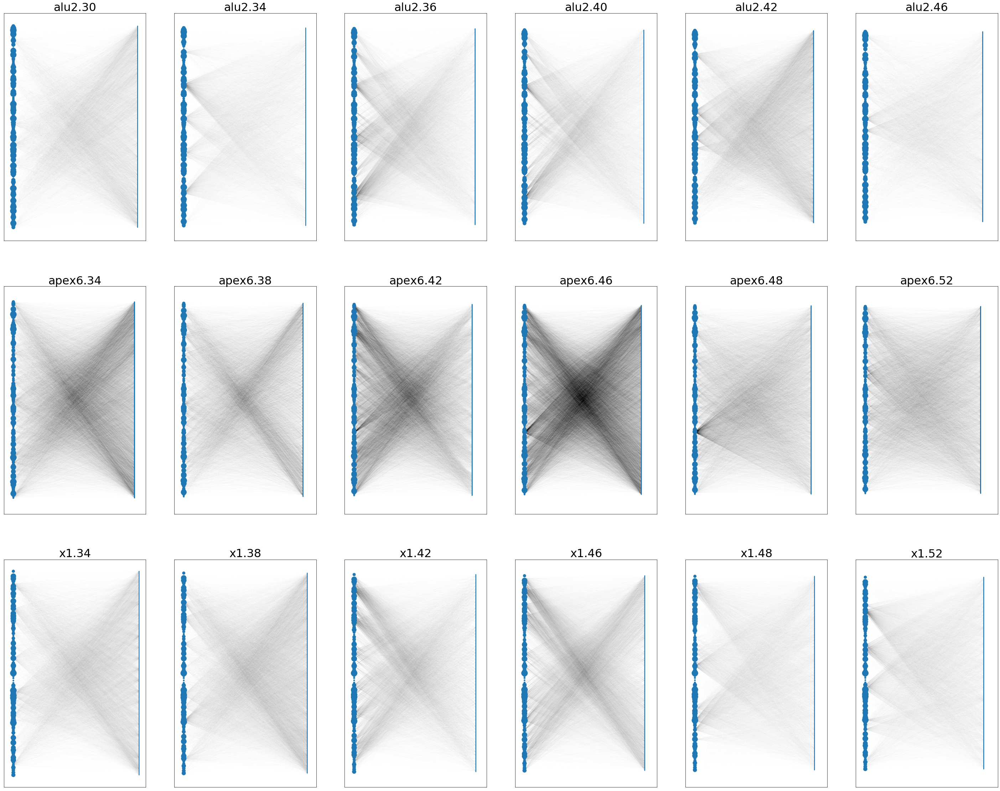

In [9]:
fig, axs = plt.subplots(nrows=3, ncols=6, figsize=(50,40), sharey=True, sharex=True)

for i in range(len(dfg)):
    bp = dfg.iloc[i]['bps']
    #print(nx.is_bipartite(bp))

    try:
        largest_component = max(nx.connected_components(bp), key=len)
        bpsub = bp.subgraph(largest_component)
        
        n1, n2 = nx.bipartite.sets(bpsub)
        # node attributes
        dd = dict(bpsub.degree)
        dc = nx.get_node_attributes(bpsub,'crit')
        dn2 = {i: .1 for i in n2}
        dc.update(dn2)

        # edge attributes
        ec = nx.get_edge_attributes(bpsub,'c')
        ew = nx.get_edge_attributes(bpsub,'t')

        ids, grp = dfg.iloc[i]['id'], dfg.iloc[i]['group']
        axi = axs[grp][ids]

        nx.draw_networkx(
            bpsub,
            pos = nx.drawing.layout.bipartite_layout(n2, n1), 
            with_labels=False, arrows=False,
            node_size=[300**v for v in dc.values()], #node_color=[v for v in dc.values()], cmap=plt.cm.Blues, 
            width=0.001, #edges=0.001, edge_color=ec.values(),
            ax = axi
        )
        axi.set_title(dfg.iloc[i].description, size=32)
        axi.set_xticks([]); axi.set_yticks([]);
    
    except:
        continue

Below, edges with weight > 0.9 and node_criticality > 0.9 are highlighted in red.

/home/asiatici/miniconda3/envs/ntds_2019/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \


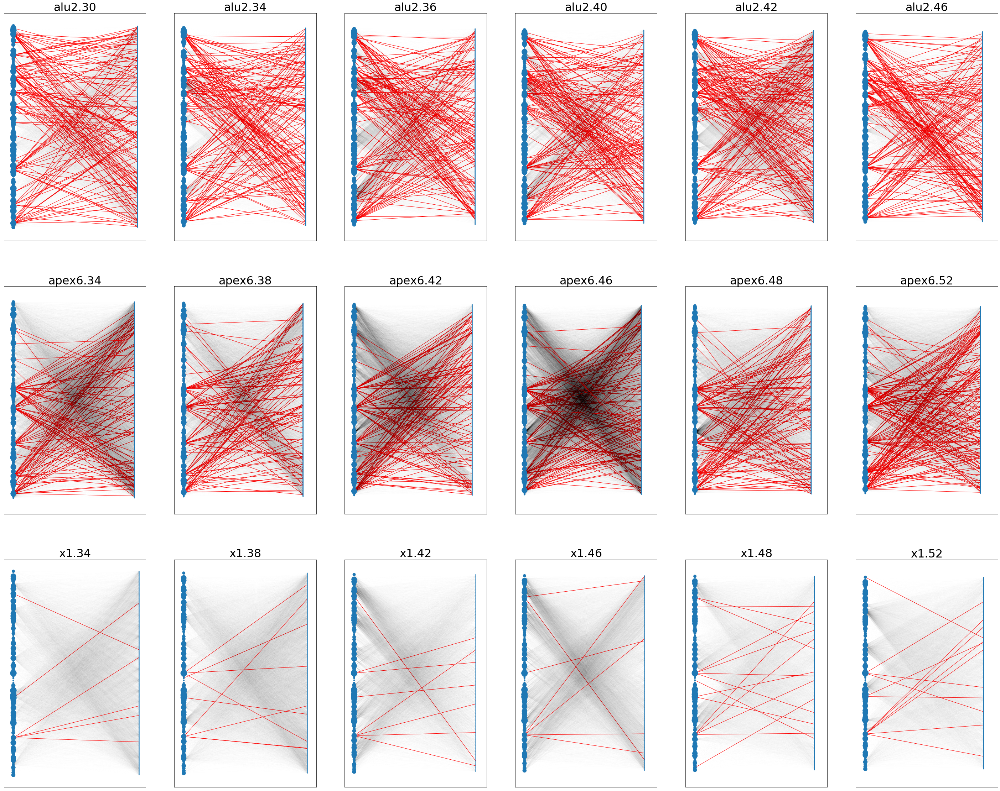

In [10]:
fig, axs = plt.subplots(nrows=3, ncols=6, figsize=(50,40), sharey=True, sharex=True)

for i in range(len(dfg)):
    bp = dfg.iloc[i]['bps']
    
    try:
        largest_component = max(nx.connected_components(bp), key=len)
        bpsub = bp.subgraph(largest_component)
        
        n1, n2 = nx.bipartite.sets(bpsub)
        # node attributes
        dd = dict(bpsub.degree)
        dc = nx.get_node_attributes(bpsub,'crit')
        dn2 = {i: .1 for i in n2}
        dc.update(dn2)

        # edge attributes
        ec = nx.get_edge_attributes(bpsub,'c')
        ew = nx.get_edge_attributes(bpsub,'t')

        ids, grp = dfg.iloc[i]['id'], dfg.iloc[i]['group']
        axi = axs[grp][ids]

        nx.draw_networkx(
            bpsub,
            pos = nx.drawing.layout.bipartite_layout(n2, n1), 
            with_labels=False, arrows=False,
            node_size=[300**v for v in dc.values()], #node_color=[v for v in dc.values()], cmap=plt.cm.Blues, 
            edges=bpsub.edges, edge_color=ec.values(), width=list(ew.values()),
            ax = axi
        )
        axi.set_title(dfg.iloc[i].description, size=32)
        axi.set_xticks([]); axi.set_yticks([]);
    
    except:
        continue
        
#plt.savefig('/Users/hartevel/Desktop/bp_w_and_crit.png', dpi=150, transparent=False)